# Dynamic SSD with Focal Loss
Here I'll be trying out the RetinaNet implementation written by rohitgeo

# Imports  

In [1]:
from apex import amp
amp_handle = amp.init(enabled=True)
%matplotlib inline
import matplotlib.pyplot as plt
import torch
from torch import nn
import torch.nn.functional as F
from ssdoil import *
from ssd import *
from utils import *

In [2]:
import pandas as pd
from pathlib import Path

from fastai.vision.transform import get_transforms
from fastai.vision.data import ObjectItemList, imagenet_stats#, bb_pad_collate
from fastai import *
from fastai.vision import *

In [3]:
torch.cuda.set_device(1)
torch.cuda.current_device()

1

In [4]:
PATH = Path(r'./Bosch_trafficlight_data/')
JPEGS = 'train/CombinedAnnotatedJPEG'
IMG_PATH = PATH/JPEGS


In [5]:
def remove_string_from_name(images, string_to_remove='/home/m090009/dev/CarND-TrafficSignal/Bosch_trafficlight_data/train/JPEGImages/'):
    for i in range(len(images)):
        images[i] = images[i].split('/')[-1]
        if '.png' in images[i]:
            images[i] = images[i].replace('.png', '.jpg') 

## Copy annotated images

In [6]:
from sklearn.model_selection import train_test_split
images, lbl_bbox, _  = get_annotationss(PATH/'annotated_train.json')
remove_string_from_name(images)

train_images, val_images, train_lbl_bbox, val_lbl_bbox = train_test_split(images, lbl_bbox, test_size=0.20, random_state=42)

img2bbox = dict(zip(train_images, train_lbl_bbox))
img2bbox_v = dict(zip(val_images, val_lbl_bbox))
def get_y_func(x):
    if x.name in img2bbox:
        bboxes, classes = img2bbox[x.name]
    else:
        bboxes, classes = img2bbox_v[x.name]
    return [bboxes, classes]

In [7]:
def bb_pad_collate(samples:BatchSamples, pad_idx:int=0) -> Tuple[FloatTensor, Tuple[LongTensor, LongTensor]]:
    "Function that collect `samples` of labelled bboxes and adds padding with `pad_idx`."
    if isinstance(samples[0][1], int): return data_collate(samples)
    max_len = max([len(s[1].data[1]) for s in samples])
    bboxes = torch.zeros(len(samples), max_len, 4)
    labels = torch.zeros(len(samples), max_len).long() + pad_idx
    imgs = []
    for i,s in enumerate(samples):
        imgs.append(s[0].data[None])
        bbs, lbls = s[1].data
        if not (bbs.nelement() == 0):
            bboxes[i,-len(lbls):] = bbs
            labels[i,-len(lbls):] = tensor(lbls)
    return torch.cat(imgs,0), (bboxes,labels)

In [8]:
print("Total: {}, Train: {}, Val: {}".format(len(images), len(train_images), len(val_images)))


Total: 3153, Train: 2522, Val: 631


In [9]:
BS = 490

In [10]:
from ssdoil import SSDObjectItemList
%time
JPEGS = 'train/AnnotatedJPEG'
data = (SSDObjectItemList.from_folder(PATH/JPEGS)
        .split_by_files(val_images)                             
        .label_from_func(get_y_func)
        .transform(get_transforms(), tfm_y=True, size=224)
        .databunch(bs=BS, collate_fn=bb_pad_collate)
        .normalize(imagenet_stats))

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.2 µs


CPU times: user 2.22 s, sys: 1.21 s, total: 3.43 s
Wall time: 35.9 s


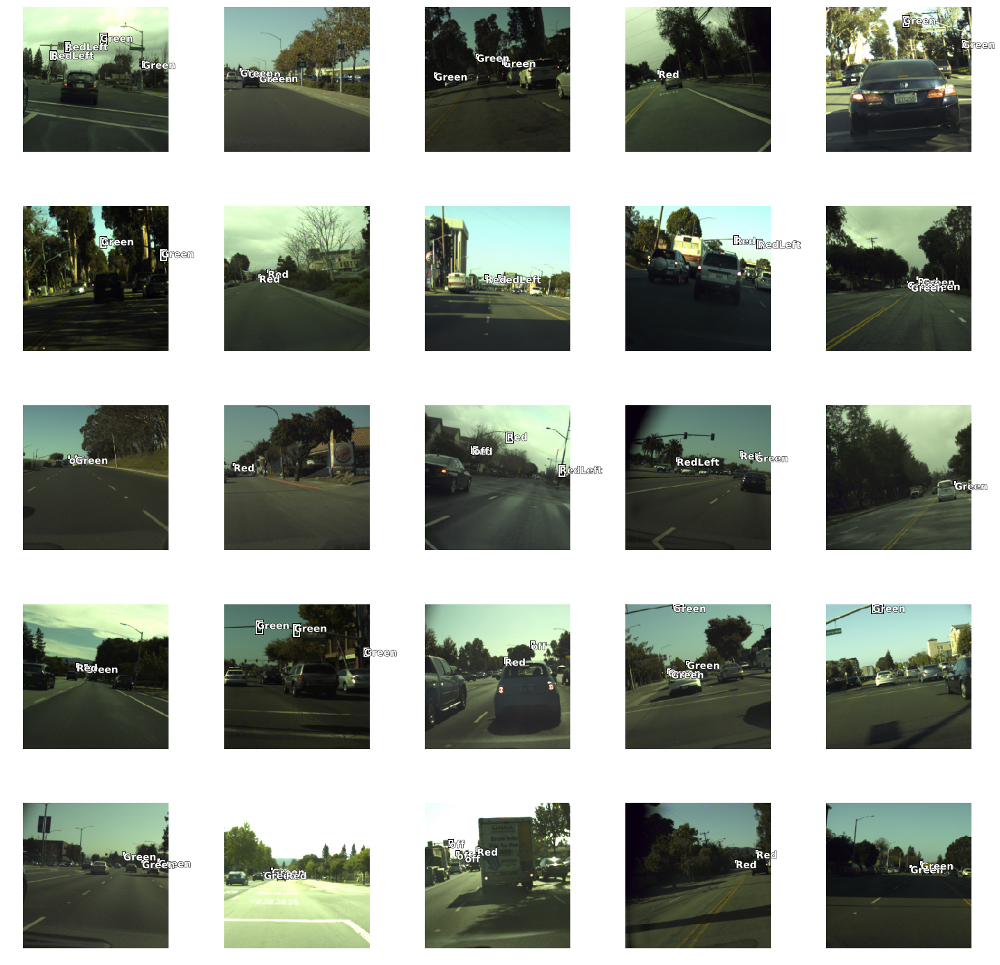

In [11]:
%%time
data.show_batch()

# Training

In [13]:
max_lr = 1e-3
lrs = np.array([max_lr/100, max_lr/10, max_lr])

In [14]:
ssd_model = SingleShotDetector(data, focal_loss=True, pretrained_path='ssd-tl-FL-715')

/home/m090009/anaconda3/envs/fastai/lib/python3.7/site-packages/fastai/vision/learner.py:93: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")


In [15]:
ssd_model.learn


Learner(data=ImageDataBunch;

Train: LabelList (2522 items)
x: SSDObjectItemList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: SSDObjectCategoryList
ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224)
Path: Bosch_trafficlight_data/train/AnnotatedJPEG;

Valid: LabelList (631 items)
x: SSDObjectItemList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: SSDObjectCategoryList
ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224)
Path: Bosch_trafficlight_data/train/AnnotatedJPEG;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dil

## Export

In [13]:
# ssd_model.learn.export()

In [14]:
# learn = load_learner(PATH/'train/AnnotatedJPEG/')

## Predict

In [15]:
# from torchvision.models import resnet34
# from fastai.transforms import *

In [16]:
# learn = ssd_model.learn

In [17]:
# trn_tfms, val_tfms = tfms_from_model(resnet34,224) # get transformations
# im = val_tfms(Image.open(PATH/'train/TESTJPEGS/test1.jpg'))
# learn.precompute=False # We'll pass in a raw image, not activations
# preds = learn.predict_array(im[None])
# np.argmax(preds) # preds are log probabilities of classes

# res = learn.pred_batch(batch=(xb,yb))

In [18]:
# %debug

In [33]:
ssd_model.fit(15, lr=lrs)

epoch,train_loss,valid_loss,time
0,44.061886,44.292992,01:12
1,44.232658,44.027405,01:12
2,44.434418,44.611450,01:11
3,44.441982,44.252525,01:12
4,44.449974,44.430641,01:12
5,44.500694,44.083637,01:12
6,44.602661,43.964375,01:12
7,44.571053,43.840393,01:12
8,44.604607,43.925465,01:12
9,44.526199,43.862110,01:12


## Save the Model

In [34]:
ssd_model.save('ssd-tl-FL-520')

## Stage 2

In [35]:
ssd_model.learn.freeze_to(-1)
lrs = np.array([max_lr/100, max_lr/10, max_lr])
ssd_model.fit(15, lrs/2)

epoch,train_loss,valid_loss,time
0,44.277248,43.700550,01:10
1,44.043480,43.450901,01:10
2,44.151573,43.550434,01:10
3,44.120075,43.355690,01:10
4,44.045818,43.518387,01:10
5,43.956409,43.375656,01:10
6,43.895557,43.390244,01:10
7,43.857761,43.363419,01:10
8,43.791821,43.291119,01:10
9,43.741631,43.269825,01:10


Gradient overflow, skipping update


## Stage 3

In [36]:
ssd_model.learn.freeze_to(-2)
ssd_model.learn.fit(15, lrs/2)

epoch,train_loss,valid_loss,time
0,43.751579,43.735401,01:11
1,43.773022,43.991539,01:11
2,43.776901,43.735058,01:11
3,43.722290,43.298859,01:11
4,43.631260,43.178329,01:10
5,43.606323,43.094704,01:11
6,43.595158,43.118786,01:11
7,43.618099,43.093143,01:10
8,43.543159,42.981083,01:11
9,43.521667,43.135284,01:11


## Stage 4

In [37]:
ssd_model.learn.freeze_to(0)
ssd_model.learn.fit(15, lrs/4)

epoch,train_loss,valid_loss,time
0,43.356091,43.001652,01:12
1,43.166759,42.906807,01:12
2,42.994987,42.970158,01:12
3,42.877888,43.213230,01:12
4,42.847042,43.127728,01:11
5,42.833733,42.874317,01:12
6,42.748779,42.888229,01:12
7,42.613743,42.963062,01:11
8,42.691277,42.865425,01:12
9,42.642544,42.736122,01:12


Gradient overflow, skipping update


## Stage 5

In [38]:
ssd_model.learn.freeze_to(0)
ssd_model.learn.fit(15, lrs/5)

epoch,train_loss,valid_loss,time
0,42.696255,42.830410,01:12
1,42.426834,43.046997,01:12
2,42.421890,42.880852,01:12
3,42.331287,42.804958,01:11
4,42.286701,42.958515,01:11
5,42.233067,43.085197,01:12
6,42.178890,43.021591,01:12
7,42.159603,42.868771,01:12
8,42.120785,42.922123,01:12
9,42.106403,42.885071,01:13


## Stage 6

In [39]:
ssd_model.learn.freeze_to(0)
ssd_model.learn.fit(15, lrs/5)

epoch,train_loss,valid_loss,time
0,42.092854,42.665005,01:12
1,42.232151,42.853439,01:12
2,42.122963,42.965622,01:12
3,42.057346,42.880604,01:12
4,41.993118,42.810966,01:12
5,41.966087,42.748226,01:12
6,41.975986,42.881107,01:12
7,41.905273,42.906178,01:12
8,41.882084,42.769341,01:12
9,41.861786,42.817474,01:12


In [40]:
ssd_model.save('ssd-tl-FL-595')

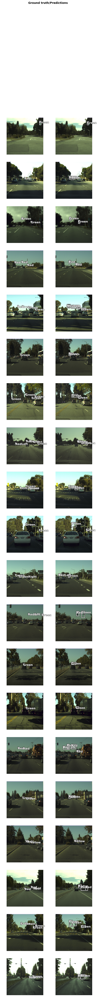

In [41]:
ssd_model.show_results(rows=20, thresh=0.28)

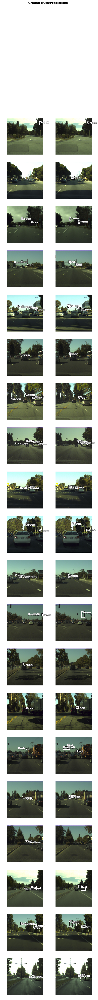

In [42]:
ssd_model.show_results(rows=20, thresh=0.3)

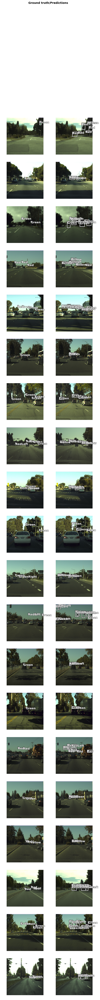

In [43]:
ssd_model.show_results(rows=20, thresh=0.1)

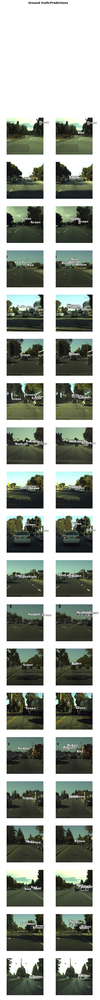

In [44]:
ssd_model.show_results(rows=20, thresh=0.2)

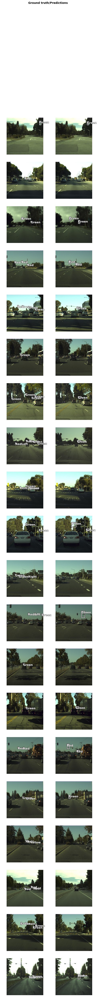

In [45]:
ssd_model.show_results(rows=20, thresh=0.4)

In [22]:
ssd_model.save('ssd-pascal-FL-20')

In [83]:
trn_tfms, val_tfms = tfms_from_model(resnet34, 224)
im = val_tfms(Image.open(PATH/'train/test1.jpg'))
ssd_model.learn.precompute = False
preds = ssd_model_array(im[None])
# np.argmax(preds)

NameError: name 'tfms_from_model' is not defined

## Show some results 

# Improve the result using feature pyramid